# First web-map with Folium


## 1. Import libraries


In [3]:
## For working with dataframes

import pandas as pd
import geopandas as gpd
import folium

from shapely import geometry


In [4]:
conda init

no change     /opt/anaconda3/condabin/conda
no change     /opt/anaconda3/bin/conda
no change     /opt/anaconda3/bin/conda-env
no change     /opt/anaconda3/bin/activate
no change     /opt/anaconda3/bin/deactivate
no change     /opt/anaconda3/etc/profile.d/conda.sh
no change     /opt/anaconda3/etc/fish/conf.d/conda.fish
no change     /opt/anaconda3/shell/condabin/Conda.psm1
no change     /opt/anaconda3/shell/condabin/conda-hook.ps1
no change     /opt/anaconda3/lib/python3.12/site-packages/xontrib/conda.xsh
no change     /opt/anaconda3/etc/profile.d/conda.csh
no change     /Users/marinapetrova/.bash_profile
No action taken.

Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install osmnx

Note: you may need to restart the kernel to use updated packages.


## 2.Read data from a geojson file


In [7]:
import osmnx as ox

In [8]:
okn_arch = gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/okn_arch.geojson')
okn_pamyat = gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/okn_pamyat.geojson')
okn_all = gpd.read_file('file:///Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/okn_all.geojson')
okn_arch_poly = gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/okn_arch_poly.geojson')
okn_pamyаt_poly = gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/okn_pamyаt_poly.geojson')

In [9]:
okn_pamyаt_poly.head()

,fid,название,адрес,Latitude,Longitude,Дата постройки,значение,тип,geometry
0,1,"Могила советских моряков, погибших при размини...",None,53.043666,158.657532,1946 г.,региональное,памятник монументального искусства,"MULTIPOLYGON (((4.77e+05 5.88e+06, 4.77e+05 5...."
1,2,Памятник В.И. Ленину,None,53.024225,158.645884,6 ноября 1978 г.,региональное,памятник монументального искусства,"MULTIPOLYGON (((4.76e+05 5.88e+06, 4.76e+05 5...."
2,3,"«Танк Т-34» , установленный в честь 30-летия П...",None,53.037343,158.657171,7 мая 1975 г.,региональное,памятник монументального искусства,"MULTIPOLYGON (((4.77e+05 5.88e+06, 4.77e+05 5...."
3,4,«Торпедный катер»- памятник морякам-десантника...,None,53.004444,158.658742,8 мая 1975 г.,региональное,памятник монументального искусства,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5...."
4,5,Обелиск воинам Советской Армии – освободителям...,None,53.019095,158.646888,6 ноября 1946 г.,федеральное,памятник монументального искусства,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5...."


In [10]:
okn_arch_poly = okn_arch_poly[['название', 'geometry', 'Дата постройки', 'значение']]
okn_arch_poly

,название,geometry,Дата постройки,значение
0,Дом учителей (интернат при городском училище),"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1910 г.,региональное
1,Дом деревянный (дом купца Подпругина)*,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1913 гг.,региональное
2,Здание бывшего почтово- телеграфного ведомства...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
3,Дом деревянный (дом казначейства с квартирами ...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
4,Дом жилой для служащих*,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
5,Дом деревянный (дом жилой для служащих казначе...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
6,Дом деревянный (дом жилой для служащих казначе...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
7,Казенный дом Министерства юстиции*,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",1909-1915 гг.,региональное
8,Казенный дом Министерства юстиции,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",1909-1912 гг.,региональное
9,Здание Окружного народного суда*,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",1909-1912 гг.,региональное


In [11]:
okn_pamyаt_poly  = okn_pamyаt_poly[['название', 'geometry', 'Дата постройки', 'значение']]
okn_pamyаt_poly

,название,geometry,Дата постройки,значение
0,"Могила советских моряков, погибших при размини...","MULTIPOLYGON (((4.77e+05 5.88e+06, 4.77e+05 5....",1946 г.,региональное
1,Памятник В.И. Ленину,"MULTIPOLYGON (((4.76e+05 5.88e+06, 4.76e+05 5....",6 ноября 1978 г.,региональное
2,"«Танк Т-34» , установленный в честь 30-летия П...","MULTIPOLYGON (((4.77e+05 5.88e+06, 4.77e+05 5....",7 мая 1975 г.,региональное
3,«Торпедный катер»- памятник морякам-десантника...,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",8 мая 1975 г.,региональное
4,Обелиск воинам Советской Армии – освободителям...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",6 ноября 1946 г.,федеральное
5,Памятник героям III-ей батареи лейтенанта А.П....,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1954 г.,федеральное
6,Мемориальный комплекс - Братская могила защитн...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1912 г.,федеральное
7,Памятник «Слава» сооружен в честь успешной обо...,"MULTIPOLYGON (((4.76e+05 5.88e+06, 4.76e+05 5....",1881 г.,федеральное
8,Памятник Жану-Француа Лаперузу (1741-1788),"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1843 г.,федеральное
9,\nПамятник-обелиск Чарльзу Кларку (1741-1779 гг.),"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1913 г.,федеральное


In [12]:
okn_pamyat = okn_pamyat.drop(columns=['адрес'])

In [13]:
okn_pamyat.head()

,fid,название,Latitude,Longitude,Дата постройки,значение,тип,geometry
0,1,"Могила советских моряков, погибших при размини...",53.043666,158.657532,1946 г.,региональное,памятник монументального искусства,POINT (4.77e+05 5.88e+06)
1,2,Памятник В.И. Ленину,53.024225,158.645884,6 ноября 1978 г.,региональное,памятник монументального искусства,POINT (4.76e+05 5.88e+06)
2,3,"«Танк Т-34» , установленный в честь 30-летия П...",53.037343,158.657171,7 мая 1975 г.,региональное,памятник монументального искусства,POINT (4.77e+05 5.88e+06)
3,4,«Торпедный катер»- памятник морякам-десантника...,53.004444,158.658742,8 мая 1975 г.,региональное,памятник монументального искусства,POINT (4.77e+05 5.87e+06)
4,5,Обелиск воинам Советской Армии – освободителям...,53.019095,158.646888,6 ноября 1946 г.,федеральное,памятник монументального искусства,POINT (4.76e+05 5.87e+06)


## 2.Create Grid (fishnet)

- to plot concentration of cultural heritage (or any other point layer) with a choropleth map


#### 2.1. Check CRS of current data and decide do you need to reproject it or not?


- here is an example of reading the current crs and reprojecting geodataframe to another crs (you need to choose by yourself do you need it or not), but I'd rather reccommend to use UTM-zone, when you plot data with folium it is better to choose Web Mercator (EPSG:3857)


In [17]:
print(okn_all.crs.name)



WGS 84 / UTM zone 57N


In [18]:
total_bounds = okn_all.total_bounds
minX, minY, maxX, maxY = total_bounds

In [19]:
square_size = 300

In [20]:
grid_cells = []
x, y = (minX, minY)
geom_array = []

while y <= maxY:
        while x <= maxX:
            geom = geometry.Polygon([(x,y), (x, y+square_size), (x+square_size, y+square_size), (x+square_size, y), (x, y)])
            geom_array.append(geom)
            x += square_size
        x = minX
        y += square_size


fishnet = gpd.GeoDataFrame(geom_array, columns=['geometry']).set_crs('EPSG:32657')
fishnet['id'] = fishnet.index

- save final grid to file if you need it


In [22]:
fishnet.to_file('grid.gpkg')

## 3. Count Points in Polygon


#### 3.1. Merge fishnet and your points data to count them in polygons


In [25]:
merged = gpd.sjoin(okn_all, fishnet, how='left', predicate='within')
merged['n'] = 1
dissolve = merged.dissolve(by="index_right", aggfunc="count")
fishnet.loc[dissolve.index, 'n'] = dissolve.n.values


#### 3.2. Plot the result


- we do it just to check the final result, no any other practical need


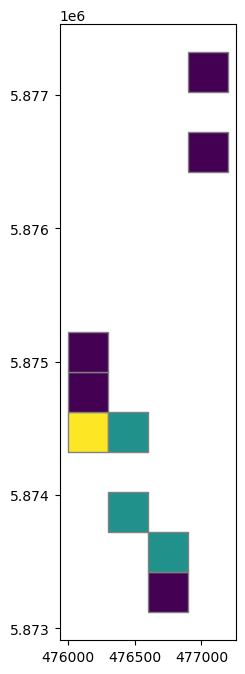

In [28]:
ax = fishnet.plot(column='n', figsize=(12, 8), cmap='viridis', scheme='natural_breaks', k=3, edgecolor="grey")


## 3. Create Web-map


In [30]:
okn_all = okn_all.to_crs('EPSG:4326')
m = folium.Map(location=[okn_all.centroid.y.mean(), okn_all.centroid.x.mean()], zoom_start=12, 	tiles="CartoDB Positron",  control_scale=True)


/var/folders/5_/85pbct4x77ddw3sgkwd123900000gn/T/ipykernel_71847/1277592142.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m = folium.Map(location=[okn_all.centroid.y.mean(), okn_all.centroid.x.mean()], zoom_start=12, 	tiles="CartoDB Positron",  control_scale=True)


#### 3.2 Explore the map box. Do we need any changes?


In [32]:
m

In [33]:
border =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/границы.geojson')

folium.GeoJson(
    border,
    name="Границы города",
    style_function=lambda x: {
        "fillColor": 'red',
        "fillOpacity": 0,
        "weight": 1,
        "color": 'red'
    },
    highlight_function=lambda x: {"fillOpacity": 0},
    zoom_on_click=True,
    show=False,
).add_to(m)

m

In [34]:
print (okn_arch_poly.dtypes)

название            object
geometry          geometry
Дата постройки      object
значение            object
dtype: object


In [35]:
okn_arch_poly

,название,geometry,Дата постройки,значение
0,Дом учителей (интернат при городском училище),"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1910 г.,региональное
1,Дом деревянный (дом купца Подпругина)*,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1913 гг.,региональное
2,Здание бывшего почтово- телеграфного ведомства...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
3,Дом деревянный (дом казначейства с квартирами ...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
4,Дом жилой для служащих*,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
5,Дом деревянный (дом жилой для служащих казначе...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
6,Дом деревянный (дом жилой для служащих казначе...,"MULTIPOLYGON (((4.76e+05 5.87e+06, 4.76e+05 5....",1909-1912 гг.,региональное
7,Казенный дом Министерства юстиции*,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",1909-1915 гг.,региональное
8,Казенный дом Министерства юстиции,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",1909-1912 гг.,региональное
9,Здание Окружного народного суда*,"MULTIPOLYGON (((4.77e+05 5.87e+06, 4.77e+05 5....",1909-1912 гг.,региональное


In [36]:



folium.GeoJson(
    okn_arch_poly,
    name="Историческая архитектура",
    tooltip=folium.GeoJsonTooltip(fields=['название','Дата постройки', 'значение']),
    popup=folium.GeoJsonPopup(fields=['название','Дата постройки', 'значение']),
    style_function=lambda x: {
        "fillColor": 'blue'
    },
    highlight_function=lambda x: {"fillOpacity": 0.5},
    zoom_on_click=True,
    show=False,
).add_to(m)
m

In [37]:

folium.GeoJson(
    okn_pamyаt_poly,
    name="Памятники монументального искусства",
    tooltip=folium.GeoJsonTooltip(fields=['название','Дата постройки', 'значение']),
    popup=folium.GeoJsonPopup(fields=['название','Дата постройки', 'значение']),
    style_function=lambda x: {
        "fillColor": 'yellow',
        "color": '#800080'
    },
    highlight_function=lambda x: {"fillOpacity": 0.8},
    zoom_on_click=True,
    show=False,
).add_to(m)

- look a the map


In [39]:
m

#### 3.5 Add points cluster


In [41]:
from folium.plugins import MarkerCluster

In [42]:
marker_cluster = MarkerCluster(name='Объекты культурного наследия')
mc1= folium.plugins.FeatureGroupSubGroup(marker_cluster, 'Объекты культурного наследия')
m.add_child(marker_cluster)
m.add_child(mc1)

mc1.add_child(folium.GeoJson(okn_all.to_json(), embed=False, show=False))


In [43]:
m

#### Данные о банях


In [45]:
banyadata =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/bany.geojson')

In [46]:
banyadata.explore(tiles='cartodbpositron')

In [47]:
banyadata.head()


,Наименование,Описание,Рубрики,Адрес,Комментарий к адресу,Почтовый индекс,Микрорайон,Район,Город,Округ,...,WhatsApp 2,Viber,Telegram 1,Telegram 2,YouTube,Широта,Долгота,2GIS URL,Тип,geometry
0,Камчатский пар,общественная баня,Бани и сауны; Массажист; SPA-процедуры,"Дальняя, 14",1 этаж,683020.0,Кирпичики м-н,None,Петропавловск-Камчатский,Петропавловск-Камчатский городской округ,...,None,None,None,None,None,53.054122,158.685015,https://2gis.com/firm/70000001056927616,branch,POINT (4.79e+05 5.88e+06)
1,Hamster пар,None,Бани и сауны,"Ватутина, 1/9",None,683024.0,None,None,Петропавловск-Камчатский,Петропавловск-Камчатский городской округ,...,None,None,None,None,None,53.051366,158.631469,https://2gis.com/firm/70000001043747815,branch,POINT (4.75e+05 5.88e+06)
2,Парыч 41,банный комплекс,Бани и сауны,"Дзержинского, 26/1",None,683017.0,None,None,Петропавловск-Камчатский,Петропавловск-Камчатский городской округ,...,None,None,None,None,None,53.041378,158.649721,https://2gis.com/firm/70000001064351083,branch,POINT (4.77e+05 5.88e+06)
3,Африка,сауна,Бани и сауны,"переулок Имени Заварицкого А.Н, 17/1",None,683023.0,None,None,Петропавловск-Камчатский,Петропавловск-Камчатский городской округ,...,None,None,None,None,None,53.076909,158.602861,https://2gis.com/firm/70000001049778306,branch,POINT (4.73e+05 5.88e+06)
4,У Семёна,сауна,Бани и сауны,"Бохняка, 18",1 этаж,683031.0,None,None,Петропавловск-Камчатский,Петропавловск-Камчатский городской округ,...,None,None,None,None,None,53.061710,158.620730,https://2gis.com/firm/13370589674737118,branch,POINT (4.75e+05 5.88e+06)


In [48]:
circle_group = folium.FeatureGroup(name='Бани')

for index, row in banyadata.iterrows() :
    location = [row['Широта'], row['Долгота']]
    rating = row['Рейтинг']
    name = row['Наименование']
    address = row['Адрес']
    
    if rating >= 5.0:
        size = 10
    elif rating >= 4.8:
        size = 8
    elif rating >= 4.3:
        size = 5
    elif rating >= 3.0:
        size = 3
    else:
        size = 1
    

    popup_content = f'''<div style="font-family: Arial; padding: 5px; display: flex; flex-direction: row; min-width: 200px;">
        <div style="display: flex; flex-direction: column; margin-right: 10px; font-weight: bold; text-align: right;">
            <p style="margin: 0;">Название</p>
            <p style="margin: 0;">Адрес</p>
            <p style="margin: 0;">Рейтинг</p>
        </div>
        
        <div style="display: flex; flex-direction: column; margin-left: 10px;">
            <p style="margin: 0;">{name}</p>
            <p style="margin: 0;">{address}</p>
            <p style="margin: 0;">{rating}</p>
        </div>
    </div>'''
    

    folium.CircleMarker(
        location=location, 
        radius=size, 
        color='blue', 
        fill=True, 
        fill_opacity=0.5, 
        weight=1,
        popup=popup_content
    ).add_to(circle_group)
    
    folium.CircleMarker(
        location=location, 
        radius=1, 
        color='blue', 
        fill=True, 
        fill_opacity=1
    ).add_to(circle_group)

m.add_child(circle_group)

In [49]:
legend_html = '''
<div style="position: fixed; bottom: 50px; left: 50px; background-color: white; border: 2px solid grey; z-index:9999; padding: 10px;">
<strong>Рейтинг объектов</strong><br>
<div style="display:flex; align-items:center;"><div style="height: 20px; width: 20px; background-color: white; border: 1px solid black; border-radius: 50%; margin-right: 5px;"></div> 5.0</div>
<div style="display:flex; align-items:center;"><div style="height: 16px; width: 16px; background-color: white; border: 1px solid black; border-radius: 50%; margin-right: 5px;"></div> от 4.8 до 5.0</div>
<div style="display:flex; align-items:center;"><div style="height: 10px; width: 10px; background-color: white; border: 1px solid black; border-radius: 50%; margin-right: 5px;"></div> от 4.3 до 4.8</div>
<div style="display:flex; align-items:center;"><div style="height: 6px; width: 6px; background-color: white; border: 1px solid black; border-radius: 50%; margin-right: 5px;"></div> от 3.0 до 4.3</div>
<div style="display:flex; align-items:center;"><div style="height: 2px; width: 2px; background-color: white; border: 1px solid black; border-radius: 50%; margin-right: 5px;"></div> меньше 3.0</div>
</div>
'''

m.get_root().html.add_child(folium.Element(legend_html))


m.save('banyadata_map_custom_legend_circle.html')

In [50]:
m.get_root().html.add_child(folium.Element(legend_html))

# Сохранить карту как HTML файл
m.save('banyadata_map_custom_legend.html')

In [51]:
from folium.plugins import HeatMap

valid_banyadata = banyadata.dropna(subset=['Широта', 'Долгота'])
valid_banyadata[['Широта', 'Долгота']] = valid_banyadata[['Широта', 'Долгота']].apply(pd.to_numeric, errors='coerce')
valid_banyadata = valid_banyadata.dropna(subset=['Широта', 'Долгота'])

heat_data_new = [[point[0], point[1], 30] for point in valid_banyadata[['Широта', 'Долгота']].values for _ in range(30)]

hm2 = HeatMap(heat_data_new, opacity=0.6, name="Тепловая карта бань").add_to(m)

In [52]:
m

## Данные о кафе, барах, ресторанах


### Кафе


In [55]:
cafedata =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/cafe.geojson')
cafedata 

,fid,Наименование,Описание,Рубрики,Адрес,Комментарий к адресу,Почтовый индекс,Микрорайон,Район,Город,...,WhatsApp 1,WhatsApp 2,WhatsApp 3,Viber,Telegram,Широта,Долгота,2GIS URL,Тип,geometry
0,1,Дым,None,Кафе; Доставка еды,"проспект Содружества, 20",None,683023,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.077877,158.621900,https://2gis.com/firm/70000001089650817,branch,POINT (4.75e+05 5.88e+06)
1,2,Милк Сити,кафе,Кафе,"Пограничная улица, 2",3 этаж,683032,None,None,Петропавловск-Камчатский,...,https://wa.me/79638326677,None,None,None,None,53.036926,158.658498,https://2gis.com/firm/70000001082465182,branch,POINT (4.77e+05 5.88e+06)
2,3,Миндаль,кафе-пекарня,Кафе; Пекарни; Кафе-кондитерские; Кофейни; Пиц...,"Ленинская улица, 59",цокольный этаж,683001,None,None,Петропавловск-Камчатский,...,https://wa.me/79024616333,None,None,None,None,53.018794,158.646998,https://2gis.com/firm/70000001064286685,branch,POINT (4.76e+05 5.87e+06)
3,5,Камчатка Рамен,кафе-лапшичная,Кафе; Быстрое питание; Доставка еды,"проспект 50 лет Октября, 16",163 место; 2 этаж,683024,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.056465,158.635661,https://2gis.com/firm/70000001028732512,branch,POINT (4.76e+05 5.88e+06)
4,6,Восьмое Небо l Eighth Sky,None,Кафе; Бары; Ночные клубы; Банкетные залы,"Автомобилистов, 12/1 стр 1",None,683024,None,None,Петропавловск-Камчатский,...,https://wa.me/79247928888,None,None,None,None,53.047384,158.633198,https://2gis.com/firm/70000001096490875,branch,POINT (4.75e+05 5.88e+06)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,77,Версаль,кафе,Кафе,"площадь Щедрина, 2",2 этаж,683001,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.006813,158.657080,https://2gis.com/firm/70000001030710105,branch,POINT (4.77e+05 5.87e+06)
57,80,Гейзер,кафе,Кафе,"Топоркова, 10",2 этаж; налево от входа,683031,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.060547,158.618348,https://2gis.com/firm/70000001066780041,branch,POINT (4.74e+05 5.88e+06)
58,87,Peak 3456,кафе,Кафе,"Максутова, 44/2",1 этаж,683032,None,None,Петропавловск-Камчатский,...,https://wa.me/79140250606,None,None,None,None,53.034680,158.662901,https://2gis.com/firm/70000001090528511,branch,POINT (4.77e+05 5.88e+06)
59,89,Альфа,кафе,Кафе,"Штурмана Елагина, 19/1",None,683013,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,52.979206,158.679916,https://2gis.com/firm/70000001068489501,branch,POINT (4.79e+05 5.87e+06)


In [56]:
cafe_group = folium.FeatureGroup(name='Кафе')

for index, row in cafedata.iterrows():
    location = [row['Широта'], row['Долгота']]
    rating = row['Рейтинг']
    name = row['Наименование']
    address = row['Адрес']
    
    if rating >= 5.0:
        size = 10
    elif rating >= 4.8:
        size = 8
    elif rating >= 4.3:
        size = 5
    elif rating >= 3.0:
        size = 3
    else:
        size = 1

    popup_content = f'''<div style="font-family: Arial; padding: 5px; display: flex; flex-direction: row; min-width: 200px;">
        <div style="display: flex; flex-direction: column; margin-right: 10px; font-weight: bold; text-align: right;">
            <p style="margin: 0;">Название</p>
            <p style="margin: 0;">Адрес</p>
            <p style="margin: 0;">Рейтинг</p>
        </div>
        
        <div style="display: flex; flex-direction: column; margin-left: 10px;">
            <p style="margin: 0;white-space: nowrap;">{name}</p>
            <p style="margin: 0;white-space: nowrap;">{address}</p>
            <p style="margin: 0;white-space: nowrap;">{rating}</p>
        </div>
    </div>'''
    
    folium.CircleMarker(location=location, radius=size, color='orange', fill=True, fill_opacity=0.5, weight=1, popup=popup_content).add_to(cafe_group)
    folium.CircleMarker(location=location, radius=1, color='orange', fill=True, fill_opacity=1).add_to(cafe_group)  # Микро точка в центре

m.add_child(cafe_group)

In [57]:
m

In [58]:
m

### Рестораны


In [60]:
resdata =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/res.geojson')
res_group = folium.FeatureGroup(name='Рестораны')


In [61]:
for index, row in resdata.iterrows():
    location = [row['Широта'], row['Долгота']]
    rating = row['Рейтинг']
    name = row['Наименование']
    address = row['Адрес']
    
    if rating >= 5.0:
        size = 10
    elif rating >= 4.8:
        size = 8
    elif rating >= 4.3:
        size = 5
    elif rating >= 3.0:
        size = 3
    else:
        size = 1
    popup_content = f'''<div style="font-family: Arial; padding: 5px; display: flex; flex-direction: row; min-width: 200px;">
        <div style="display: flex; flex-direction: column; margin-right: 10px; font-weight: bold; text-align: right;">
            <p style="margin: 0;">Название</p>
            <p style="margin: 0;">Адрес</p>
            <p style="margin: 0;">Рейтинг</p>
        </div>
        
        <div style="display: flex; flex-direction: column; margin-left: 10px;">
            <p style="margin: 0;white-space: nowrap;">{name}</p>
            <p style="margin: 0;white-space: nowrap;">{address}</p>
            <p style="margin: 0;white-space: nowrap;">{rating}</p>
        </div>
    </div>'''
    
    folium.CircleMarker(location=location, radius=size, color= '#e653c1', fill=True, fill_opacity=0.5, weight=1,  popup = popup_content).add_to(res_group)
    folium.CircleMarker(location=location, radius=1, color='#e653c1' , fill=True, fill_opacity=1).add_to(res_group)  # Микро точка в центре
m.add_child(res_group)

In [62]:
resdata

,fid,Наименование,Описание,Рубрики,Адрес,Комментарий к адресу,Почтовый индекс,Микрорайон,Район,Город,...,WhatsApp 2,WhatsApp 3,Viber,Telegram,YouTube,Широта,Долгота,2GIS URL,Тип,geometry
0,1,Da Vinci,ресторан,Рестораны,"проспект 50 лет Октября, 16/1",4 этаж,683024,None,None,Петропавловск-Камчатский,...,None,None,None,https://t.me/+79147868420,None,53.057035,158.634680,https://2gis.com/firm/13370589674736961,branch,POINT (4.76e+05 5.88e+06)
1,2,Рыба на суше,ресторан паназиатской кухни,Рестораны; Бары; Суши-бары,"Пограничная улица, 2/2",3 этаж; верхняя парковка,683032,None,None,Петропавловск-Камчатский,...,None,None,None,https://t.me/+79638313377,None,53.036859,158.659967,https://2gis.com/firm/70000001077482821,branch,POINT (4.77e+05 5.88e+06)
2,3,Русский Двор,ресторан,Рестораны,"Топоркова, 1/2",None,683031,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.064551,158.624023,https://2gis.com/firm/70000001099069295,branch,POINT (4.75e+05 5.88e+06)
3,6,Кальдера,None,Рестораны; Бары,"Ленинградская, 35",1 этаж,683003,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.034159,158.648225,https://2gis.com/firm/70000001083870730,branch,POINT (4.76e+05 5.88e+06)
4,8,Марико,грузинский ресторан,Рестораны; Караоке-залы,"проспект Победы, 67",None,683902,10 км м-н,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.071104,158.587372,https://2gis.com/firm/70000001088044501,branch,POINT (4.72e+05 5.88e+06)
5,9,"Два моря, океан",ресторан,Рестораны; Кейтеринг; Доставка еды,"Озерновская Коса, 11",1 этаж,683001,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.028327,158.640518,https://2gis.com/firm/70000001055032841,branch,POINT (4.76e+05 5.88e+06)
6,10,Yamato,ресторан-коктейльный бар,Рестораны; Доставка еды; Караоке-залы; Банкетн...,"улица Лукашевского, 5",1 этаж,683024,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.059152,158.634117,https://2gis.com/firm/13370589674736971,branch,POINT (4.75e+05 5.88e+06)
7,11,Сыр да Лава,ресторан-сыроварня,Рестораны,"улица Тушканова, 6",None,683031,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.060304,158.630655,https://2gis.com/firm/70000001080418565,branch,POINT (4.75e+05 5.88e+06)
8,12,Happy Butcher,мясной ресторан,Рестораны; Доставка еды; Бары,"проспект 50 лет Октября, 10а",None,683024,None,None,Петропавловск-Камчатский,...,None,None,None,None,None,53.053736,158.639795,https://2gis.com/firm/70000001029852047,branch,POINT (4.76e+05 5.88e+06)
9,13,Сан Марино,ресторан,Рестораны; Банкетные залы,"проспект Карла Маркса, 29/1",1 этаж,683031,None,None,Петропавловск-Камчатский,...,None,None,None,None,https://youtube.com/@sanmarinorest,53.065547,158.626881,https://2gis.com/firm/13370589674736968,branch,POINT (4.75e+05 5.88e+06)


### Бары


In [64]:
bardata =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/bar.geojson')
bar_group = folium.FeatureGroup(name='Бары')

In [65]:
for index, row in bardata.iterrows():
    location = [row['Широта'], row['Долгота']]
    rating = row['Рейтинг']
    name = row['Наименование']
    address = row['Адрес']
    
    if rating >= 5.0:
        size = 10
    elif rating >= 4.8:
        size = 8
    elif rating >= 4.3:
        size = 5
    elif rating >= 3.0:
        size = 3
    else:
        size = 1
    popup_content = f'''<div style="font-family: Arial; padding: 5px; display: flex; flex-direction: row; min-width: 200px;">
        <div style="display: flex; flex-direction: column; margin-right: 10px; font-weight: bold; text-align: right;">
            <p style="margin: 0;">Название</p>
            <p style="margin: 0;">Адрес</p>
            <p style="margin: 0;">Рейтинг</p>
        </div>
        
        <div style="display: flex; flex-direction: column; margin-left: 10px;">
            <p style="margin: 0;white-space: nowrap;">{name}</p>
            <p style="margin: 0;white-space: nowrap;">{address}</p>
            <p style="margin: 0;white-space: nowrap;">{rating}</p>
        </div>
    </div>'''
    folium.CircleMarker(location=location, radius=size, color='red', fill=True, fill_opacity=0.5, weight=1, popup=popup_content).add_to(bar_group)
    folium.CircleMarker(location=location, radius=1, color='red', fill=True, fill_opacity=1).add_to(bar_group)  # Микро точка в центре
m.add_child(bar_group)

In [66]:
all_eat =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/all_eat.geojson')

valid_all_eat = all_eat.dropna(subset=['Широта', 'Долгота'])
valid_all_eat[['Широта', 'Долгота']] = valid_all_eat[['Широта', 'Долгота']].apply(pd.to_numeric, errors='coerce')
valid_all_eat = valid_all_eat.dropna(subset=['Широта', 'Долгота'])

# Создание данных для тепловой карты
heat_data_new = [[point[0], point[1], 30] for point in valid_all_eat[['Широта', 'Долгота']].values for _ in range(30)]

# Создание тепловой карты
hm1 = HeatMap(heat_data_new, opacity=0.6, name="Тепловая карта мест общественного питания").add_to(m)

In [67]:
m

#### Отели


In [69]:
hoteldata =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/hotel.geojson')
hotel_group = folium.FeatureGroup(name='Отели и гостиницы')

In [70]:
for index, row in hoteldata.iterrows():
    location = [row['Широта'], row['Долгота']]
    rating = row['Рейтинг']
    name = row['Наименование']
    address = row['Адрес']
    
    if rating >= 5.0:
        size = 10
    elif rating >= 4.8:
        size = 8
    elif rating >= 4.3:
        size = 5
    elif rating >= 3.0:
        size = 3
    else:
        size = 1
    popup_content = f'''<div style="font-family: Arial; padding: 5px; display: flex; flex-direction: row; min-width: 200px;">
        <div style="display: flex; flex-direction: column; margin-right: 10px; font-weight: bold; text-align: right;">
            <p style="margin: 0;">Название</p>
            <p style="margin: 0;">Адрес</p>
            <p style="margin: 0;">Рейтинг</p>
        </div>
        
        <div style="display: flex; flex-direction: column; margin-left: 10px;">
            <p style="margin: 0;white-space: nowrap;">{name}</p>
            <p style="margin: 0;white-space: nowrap;">{address}</p>
            <p style="margin: 0;white-space: nowrap;">{rating}</p>
        </div>
    </div>'''


    folium.CircleMarker(location=location, radius=size, color='brown', fill=True, fill_opacity=0.5, weight=1, popup=popup_content).add_to(hotel_group)
    folium.CircleMarker(location=location, radius=1, color='brown', fill=True, fill_opacity=1).add_to(hotel_group)  # Микро точка в центре
m.add_child(hotel_group)

In [71]:
import folium
from folium.features import DivIcon

prddata =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/prd.geojson')

prddata

,fid,name,geometry
0,2,"Скалы ""Три брата""",POINT (4.8e+05 5.86e+06)
1,3,Береза каменная,POINT (4.76e+05 5.88e+06)
2,4,Сопка Мишенная,POINT (4.76e+05 5.88e+06)
3,5,Сопка Зеркальная,POINT (4.78e+05 5.88e+06)
4,6,Сопка Петропавловская,POINT (4.77e+05 5.88e+06)
5,7,Памятник природы регионального значения Сопка ...,POINT (4.76e+05 5.87e+06)
6,8,Водопады,POINT (4.78e+05 5.88e+06)
7,9,Камчаткий камень,POINT (4.79e+05 5.87e+06)
8,10,Гора Узовская,POINT (4.77e+05 5.87e+06)
9,11,Гора Удж,POINT (4.8e+05 5.87e+06)


In [72]:
from folium.plugins import MarkerCluster

cluster = MarkerCluster(name="Природные достопримечательности (маркеры)").add_to(m)

folium.GeoJson(
    prddata,
    name="Природные достопримечательности (маркеры)",
    marker=folium.Marker(icon=folium.Icon(icon='flag', color='green'),
    popup=folium.GeoJsonPopup(fields=["name"])
)).add_to(cluster)

In [73]:
m

In [74]:
poly_prd =  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/poly_prd.geojson')
folium.GeoJson(
    poly_prd,
    name="Природные достопримечательности (полигоны)",
    tooltip=folium.GeoJsonTooltip(fields=['name']),
    popup=folium.GeoJsonPopup(fields=['name']),
    style_function=lambda x: {
        "fillColor": 'green',
        "color": 'green'
    },
    highlight_function=lambda x: {"fillOpacity": 0.5},
    zoom_on_click=True,
    show=False,
).add_to(m)
m

In [75]:

marsh=  gpd.read_file('/Users/marinapetrova/Downloads/и/гисы про/3.2./geojson/marsh.geojson')

# Добавление GeoJson с цветом маркера на основе значения 'fid'
folium.GeoJson(
    marsh,
    name="Туристические пешеходные маршруты",
    zoom_on_click=True,
    style_function=lambda x: {
        'color' : x['properties']['color'],
    },
).add_to(m)

In [76]:
m

#### Add different widgets to map


In [78]:
from folium.plugins import MousePosition
from folium.plugins import Fullscreen
from folium.plugins import MiniMap


In [79]:
folium.LayerControl().add_to(m)

In [80]:
formatter = "function(num) {return L.Util.formatNum(num, 3) + ' &deg; ';};"

MousePosition(
    position="bottomright",
    separator=" | ",
    empty_string="NaN",
    lng_first=True,
    num_digits=20,
    prefix="Coordinates:",
    lat_formatter=formatter,
    lng_formatter=formatter,
).add_to(m)

Fullscreen(
    position="bottomright",
    title="Expand me",
    title_cancel="Exit me",
    force_separate_button=True,
).add_to(m)


m1 = folium.Map(location=[okn_all.centroid.y.mean(), okn_all.centroid.x.mean()], zoom_start=14)

MiniMap(tile_layer="CartoDB Positron").add_to(m)

/var/folders/5_/85pbct4x77ddw3sgkwd123900000gn/T/ipykernel_71847/1585623580.py:22: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  m1 = folium.Map(location=[okn_all.centroid.y.mean(), okn_all.centroid.x.mean()], zoom_start=14)


In [81]:
m

In [82]:
m

## 4. Save map to index.html file and prepare to publish it


In [148]:
m.save("index3.html")